# Process Mining - Analysis

## Table of Contents
1. [Process Discovery](#Process-Discovery)
    1. [Object-Centric Process Discovery](#Process-Discovery)
2. [Conformance Checking](#Conformance-Checking)
3. [Process Model Evaluation](#Process-Model-Evaluation)
4. [Conclusion](#Conclusion)
4. [References](#References)

In [8]:
import warnings
import pandas as pd
import pm4py

from utils import utils

# Suppress DeprecationWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

## Process Discovery

Process discovery delves into the extraction and visualization of the inherent processes within an organization, solely based on event data. By employing sophisticated algorithms, this approach sifts through event logs, capturing sequences and patterns of activities. As a result, it automatically yields accurate and objective process models, reflecting the actual workflows undertaken within an organization. This automation bypasses the need for stakeholder interviews or manual documentation. The power of process discovery lies in its ability to unveil real-world operational flows, pinpointing bottlenecks, inefficiencies, and deviations, thereby facilitating precise process optimization and decision-making.

There are various algorithms for Process Discovery. Some notable process discovery algorithms:

- **Alpha Algorithm**: One of the earliest and simplest algorithms, it provides a foundation for process discovery but might not always produce accurate or sound models, especially with complex logs.


parsing log, completed traces :: 100%|██████████| 6/6 [00:00<00:00, 2766.69it/s]


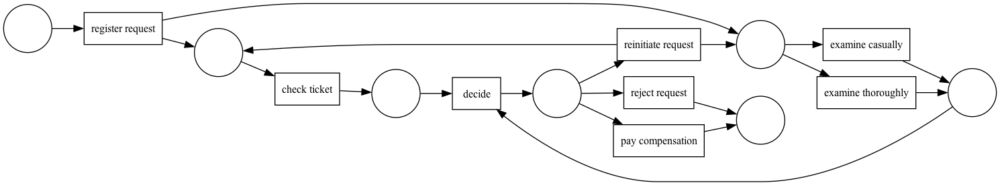

In [33]:
log = pm4py.read_xes('data/input/running-example.xes')

petri_net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(log)
pm4py.vis.view_petri_net(petri_net)

- **Heuristic Miner**: This method focuses on capturing the frequency and dependencies of activities, using heuristics to filter out noise and infrequent behavior. The result is a graphical representation called a heuristic net, which offers a clear view of the predominant flows and relations between activities in a process.

    The dependency_threshold parameter in the heuristic net discovery algorithm dictates the level (or threshold) at which dependencies between activities are considered significant.

    A dependency between two activities (let's say A to B) signifies that activity A is often followed by activity B in the event logs. The strength of this dependency can be computed based on frequencies observed in the event log. For example, if after A, B follows 99 times out of 100, then the dependency strength is 0.99 or 99%.

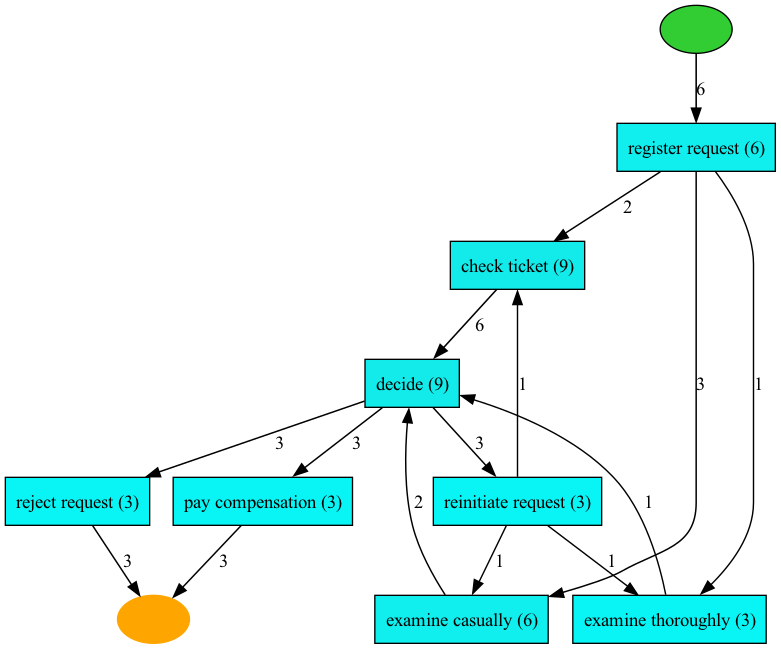

In [51]:
heu_net = pm4py.discovery.discover_heuristics_net(log, dependency_threshold=0.5)
pm4py.vis.view_heuristics_net(heu_net)


- **Inductive Miner**: This algorithm constructs a process tree by recursively splitting logs based on activities, aiming to represent the underlying process faithfully while minimizing deviations from the log. This results in a model that captures the primary behavior of the process and offers a balance between simplicity and precision.

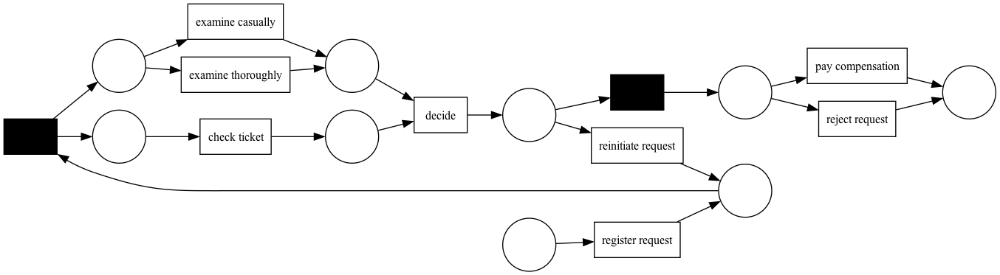

In [59]:
inductive_net, initial_marking_2, final_marking_2 = pm4py.discovery.discover_petri_net_inductive(log)
pm4py.vis.view_petri_net(inductive_net)

The "black boxes" you see in a Petri net representation are typically referred to as "silent" or "tau" transitions. They are used to reflect certain constructs or behaviors of the process that aren't directly evident from the event log. Essentially, these transitions facilitate the correct functioning of the model but do not have a direct corresponding activity in the log.

- **Directly Follows Graph**: In the realm of process mining, PM4PY offers tools to discover a Directly Follows Graph (DFG) from event logs. A DFG simplifies the complex maze of event sequences by representing only the direct succession relations between activities. Each node signifies an activity, while directed edges show the order of occurrences, often weighted by frequency. When analysts delve into event logs using PM4PY, the DFG serves as an initial snapshot, providing immediate insights into prevalent activity sequences and potential bottlenecks or exceptions. This foundational visualization can be a precursor to more intricate process models, aiding in a layered approach to process discovery and analysis.

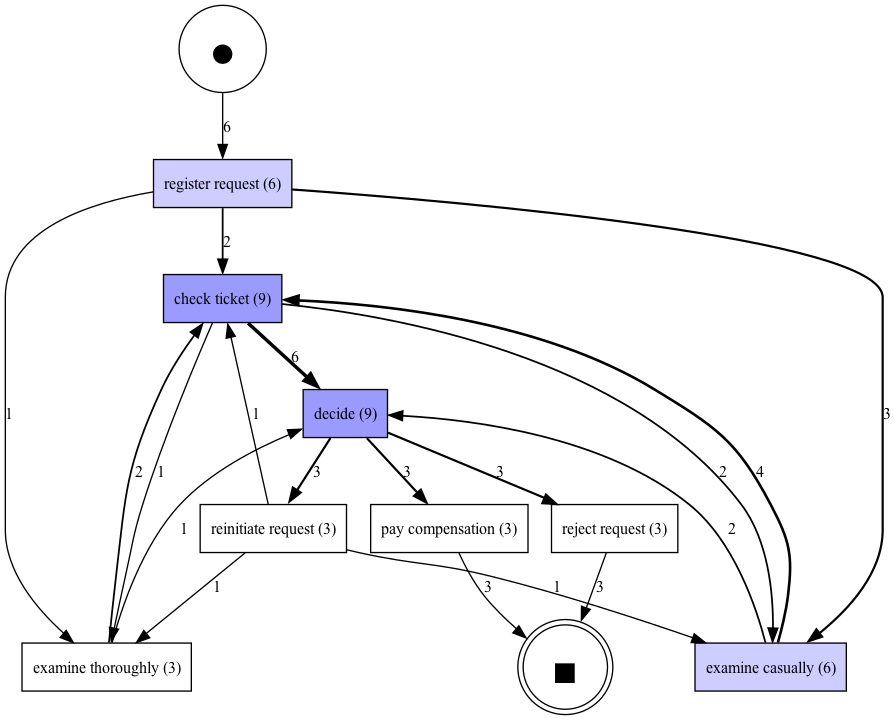

In [58]:
dfg, start_activities, end_activities = pm4py.discovery.discover_dfg(log)
pm4py.vis.view_dfg(dfg, start_activities, end_activities)

- **Hybrid approaches**: These combine various techniques to take advantage of the strengths of different algorithms and produce more accurate models.


For more details, it is recommended to check out [this page](https://www.workfellow.ai/learn/process-mining-algorithms-simply-explained).

It's essential to note that the ideal algorithm often depends on the specific requirements, nature of the event log, and the intricacies of the organizational processes. Moreover, as the field of process mining evolves, new algorithms and improvements to existing ones continue to emerge.

## Object-centric Process Discovery

As it is already discussed, object-centric event logs can be flattened into traditonal event log formats and then the functions that are shown above can be applied to those logs. Alternatively, object-centric petri nets and DFGs can be discovered through PM4PY directly out of the object-centric event logs.

### Discovering OC Petri Net

/opt/homebrew/lib/python3.10/site-packages/pm4py/objects/ocel/util/ocel_consistency.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(subset=[fie], how="any", inplace=True)
/opt/homebrew/lib/python3.10/site-packages/pm4py/objects/ocel/util/ocel_consistency.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[fie] = df[fie].astype("string")


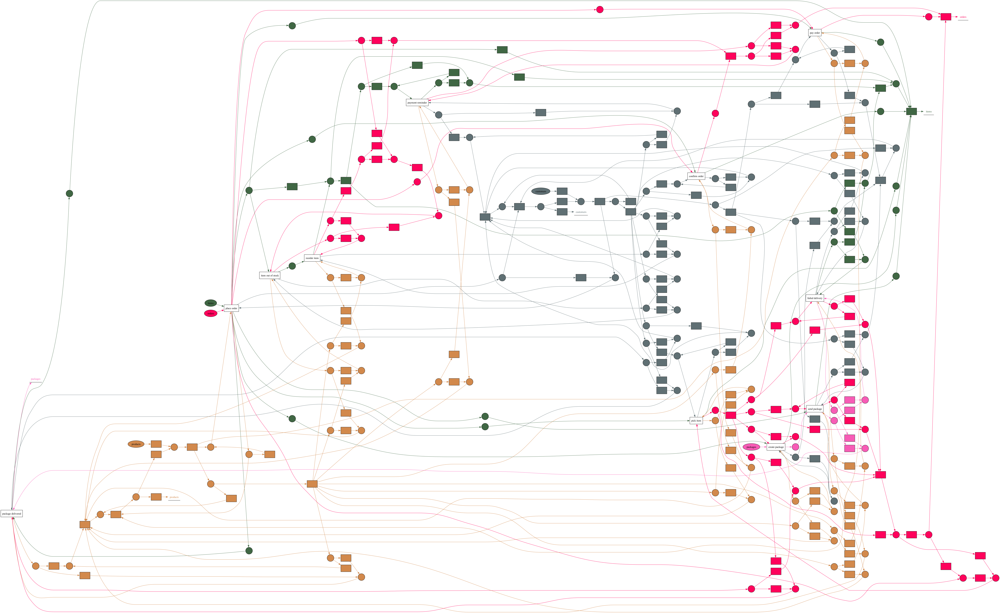

In [68]:
oc_log = pm4py.read_ocel("data/input/running-example.xmlocel")
oc_pn = pm4py.ocel.discover_oc_petri_net(oc_log)
pm4py.vis.view_ocpn(oc_pn)

In the context of an Object-Centric Petri Net (OCPN), the visualization can indeed look more complicated compared to traditional process mining visualizations, as it combines the interplay between both activities and objects. Here's a breakdown of the elements you might see:

- White Boxes (Transitions): These typically represent the activities in your process. Just like in traditional Petri nets, transitions correspond to the events or tasks that take place.

- Rectangles (Object Types): These represent the different types of objects in your process. In an Object-Centric model, activities interact with different types of objects, and these rectangles categorize the objects based on their type

- Spheres (Places): In Petri nets, places typically represent the state or condition between events. In an OCPN, these can be related to both the state of the process and the state of the objects. They help to control the flow of the process.

- Colors:
    - Red: This might indicate an error or something critical in the process.
    - Yellow: Usually used to represent a warning or something that requires attention.
    - Gray: This could indicate inactive or less relevant parts of the process.
    - Pink: The specific meaning might vary, but in some contexts, it can indicate a secondary or auxiliary flow. 


- Tokens: If you see small black dots inside the spheres (places), these are tokens. They signify the 'active' state in the process. A token moves from one place to another through transitions, indicating the progress of cases in the process.

- Arrows: These connect transitions to places and vice-versa, indicating the flow and dependencies between activities and states or conditions.

The key to interpreting an Object-Centric Petri Net is to focus on the interactions between activities (white boxes) and object types (rectangles). It showcases how different activities in the process affect or are influenced by various objects.

### Discovering OC-DFG

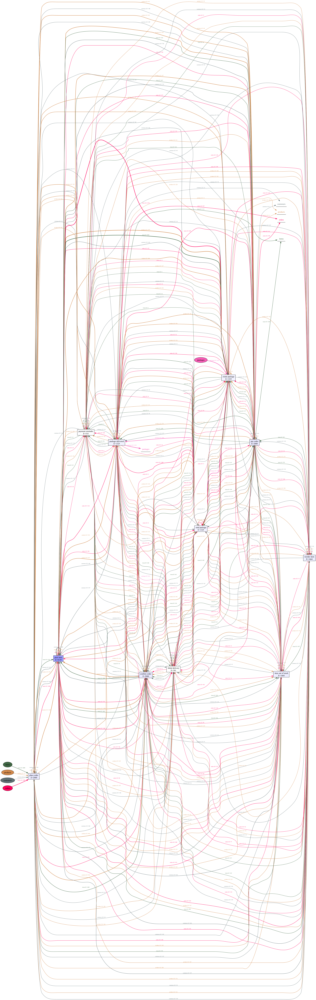

In [70]:
oc_dfg = pm4py.ocel.discover_ocdfg(oc_log)
pm4py.vis.view_ocdfg(oc_dfg)

#### Object-Centric Directly Follows Graph (OCDFG):

Traditional Directly Follows Graphs (DFGs) capture the sequence of activities, denoting which activity often follows another. In object-centric logs, activities relate not only to one another but also to objects. Hence, an OCDFG visualizes the interactions between activities and objects, as well as the flow between the activities themselves.

- Nodes:
    Activity Nodes: These represent the distinct activities found in your log. Each activity node shows a specific action that can be performed.
    Object Nodes: These depict the various objects in the event log. In object-centric process mining, objects play a significant role as entities that get affected or manipulated by the activities.

- Edges:
    Activity to Activity: Similar to traditional DFGs, these edges show the order of activities. If there's an edge from Activity A to Activity B, it means that in the event log, Activity A is often directly followed by Activity B.
    Activity to Object and vice versa: These edges represent interactions. If there's an edge from Activity A to Object X, it indicates that Activity A usually involves or impacts Object X. Conversely, an edge from Object X to Activity A could show that after some interaction with Object X, Activity A often gets executed.

- Edge Weights: 
    Edges might have weights or numbers associated with them, indicating the frequency. A higher weight indicates that the respective sequence (be it activity-to-activity or activity-to-object) is more common in the log.

Visualization Benefits:

The OCDFG provides a bird's-eye view of the process flow, incorporating object interactions. This is especially beneficial when processes involve multiple entities, and understanding their interplay becomes crucial.

- Holistic View: Beyond just viewing which activity follows which, you can see which objects are most frequently involved and how they relate to various activities.
- Bottleneck Identification: By observing the edge weights, you can discern which paths are more frequently taken and potentially identify bottlenecks or inefficiencies in the process.
- Process Variants: Multiple paths between activities highlight the different ways processes can unfold, providing insights into process variants.

To fully interpret the OCDFG, you'd typically correlate it with domain knowledge and the specificities of the process you're analyzing.

The generated petri nets and DFGs can be exported in PNG format as the following:

In [72]:
pm4py.vis.save_vis_dfg(dfg, start_activities, end_activities, "data/output/example_dfg.png")
pm4py.vis.save_vis_petri_net(petri_net, initial_marking, final_marking, "data/output/example_petri_net_alpha.png")
pm4py.vis.save_vis_petri_net(inductive_net,initial_marking_2, final_marking_2, "data/output/example_petri_net_inductive.png")
pm4py.vis.save_vis_heuristics_net(heu_net, "data/output/example_heu_net.png")
pm4py.vis.save_vis_ocpn(oc_pn, 'data/output/example_ocpn.png')
pm4py.vis.save_vis_ocdfg(oc_dfg, 'data/output/example_ocdfg.png')

The saved process models can be found in  `data/output/`.

### Conformance Checking

Conformance checking refers to the process of comparing an actual, recorded event log with a reference process model to identify deviations and ensure compliance. Think of it as a quality check: you have a blueprint (the process model) of how things should ideally operate, and you have the actual events (the event log) showing what truly happened. By juxtaposing these two, conformance checking highlights discrepancies, revealing areas where the real-world process might diverge from the intended model. This could mean identifying bottlenecks, detecting non-compliant activities, or spotting inefficiencies. By addressing these deviations, organizations can optimize processes, enhance compliance, and ultimately deliver better results. Understanding conformance checking is crucial as it provides a direct way to assess the effectiveness and adherence of real-world processes to their intended designs.


#### Token-Based Replay

Token-based Replay stands as a cornerstone in the realm of conformance checking, bridging the gap between the theoretical world of process models and the real-world dynamics of event logs. At its core, the technique revolves around simulating the progression of each trace from the event log on a given Petri net, laying the groundwork to assess the harmony—or discord—between observed and modeled behaviors. Imagine initiating this process with a single token stationed at the Petri net's starting point, the initial marking. As we step through each event in a trace, the token navigates the intricate paths of the Petri net, attempting to fire corresponding transitions. If a transition fires successfully, it consumes tokens from its input and passes them to its output. However, a transition's failure to fire signals a discord, indicating that our real-world trace can't find its mirror in the model.

##### Diagnostics

The diagnostic insights gleaned from token-based replay are profoundly telling. They quantify discrepancies in terms of missing or remaining tokens, revealing the junctures where reality veers from the model. Moreover, the technique serves as a pivotal metric of fitness. A high fitness score paints a picture of a process model adept at mimicking the log's behavior. Yet, the simplicity of token-based replay—its very strength—also lays bare its limitations. It excels in assessing fitness but falters when gauging precision. A model could theoretically dance beyond the log's boundaries, entertaining myriad behaviors, but as long as it can emulate the log's rhythm, it earns its badge of high fitness. This binary nature, while making the method intuitive, also strips it of the nuanced diagnostics offered by techniques like alignment-based conformance checking

PM4PY offers the following diagnostic insights:
- Analyzing the throughput of transitions executed incongruously with the reference process model (represented as a Petri net).
- Examining the throughput of activities that aren't defined within the model.
- Conducting a Root Cause Analysis to identify reasons behind the misaligned execution of transitions.
- Investigating the underlying causes for the execution of activities not specified in the process model.

With our previously discovered model and the event logs, we can now perform conformance checking using the token-based replay:

In [81]:
replayed_traces = pm4py.conformance.conformance_diagnostics_token_based_replay(log, inductive_net, initial_marking_2, final_marking_2)

replaying log with TBR, completed variants :: 100%|██████████| 6/6 [00:00<00:00, 3307.81it/s]


replayed_traces is a list of dictionaries. You can an example entry below:

In [83]:
replayed_traces

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(81827215-ea81-4015-8726-88ba19698818, 'register request'),
   (tauSplit_3, None),
   (e209f090-d608-49a1-8cad-34b852bc7749, 'examine thoroughly'),
   (01251b6c-4c4d-48a8-b364-0f12d3d0e12e, 'check ticket'),
   (57c686cc-2103-463e-83bf-fd3939ba7bfd, 'decide'),
   (skip_5, None),
   (9e1f646c-c0a1-4e42-a251-1b77f6e1453f, 'reject request')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 9,
  'remaining_tokens': 0,
  'produced_tokens': 9},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(81827215-ea81-4015-8726-88ba19698818, 'register request'),
   (tauSplit_3, None),
   (01251b6c-4c4d-48a8-b364-0f12d3d0e12e, 'check ticket'),
   (c18351b4-d3b5-414b-a4b8-5d98af47a50b, 'examine casually'),
   (57c686cc-2103-463e-83bf-fd3939ba7bfd, 'decide'),
   (skip_5, None),
   (2fddec97-6ac1-4623

##### Key Observations:

1. **Fitness**:
   - Every trace in this list is labeled as `'trace_is_fit': False`, indicating that none of these traces perfectly align with the Petri net. No trace follows the exact path the Petri net expects without discrepancies.
   - The `trace_fitness` value quantifies the level of conformance for each trace. It's a ratio where a score of 1 would mean a perfect fit, and anything less than 1 indicates some form of deviation. Most of your traces have a fitness around 0.71 to 0.88, implying that while they do align considerably with the Petri net, there are specific areas where the recorded behavior in the log diverges from the expected behavior in the model.

2. **Activated Transitions**:
   - The `activated_transitions` list in each entry tells us the sequence of activities (transitions) that were triggered as the trace was replayed. For example, in the first trace, activities like 'register request', 'examine thoroughly', 'check ticket', etc., were activated.

3. **Token Diagnostics**:
   - `missing_tokens`: Every trace has 2 missing tokens. This implies that for every trace, there were 2 instances where a transition in the Petri net was supposed to fire, but there weren't enough tokens available, indicating a mismatch.
   - `consumed_tokens` and `produced_tokens` show the number of tokens used and generated during the replay, respectively. Ideally, in a perfect replay, these values should be equal, and there should be no remaining tokens.
   - `remaining_tokens` indicates that 2 tokens were left behind after processing each trace, further cementing the notion of misalignment. 

4. **Transitions with Problems**:
   - The `transitions_with_problems` for every trace points to the '(register request, 'register request')' transition. This suggests that there might be an issue with how the 'register request' activity is modeled in the Petri net, or perhaps this activity in the log frequently deviates from the expected path in the model.

5. **Marking**:
   - `reached_marking` indicates the markings (or places with tokens) when the trace replay finished. Notably, every trace has ended with tokens in 'end' and 'source', which might be indicative of the model expecting more or different activities than what occurred.
   - `enabled_transitions_in_marking` provides transitions that could still be triggered given the final marking after the trace replay. In this output, it's always an empty set, implying that no further transitions could be executed with the available tokens at the end of the replay.

The results shed light on potential areas of misalignment between your event log and the Petri net. A recurring issue is the 'register request' activity, which consistently presents problems in token replay. Addressing these discrepancies can enhance the model's representation of real-world processes, helping stakeholders make informed decisions for process optimization.

#### Alignment-Based Replay

Alignment-Based Replay is a powerful method used in conformance checking. It helps us understand how well the actual events in an event log match up with the expected sequence of events in a process model, like a Petri net. Think of it like trying to align two strings of beads, where one string represents the real-world events and the other shows what the process model expects. As we compare each bead (or event) from the two strings, we're looking for a perfect match. When the beads line up, it means the real-world event matches the model's expectation. However, if they don't align, there's a mismatch, showing us where the real-world process differs from our model. By identifying these mismatches, Alignment-Based Replay gives us clear insights into where our processes might need tweaking or improvements.


PM4PY also provides Alignment-Based Replay. Application is left as an exercise to the reader.


## Process Model Evaluation

After discovering a process model, or when comparing several models, it's essential to evaluate its quality to determine its accuracy and usability. The four primary metrics used for this are:

### Fitness

Fitness gauges how well a process model reproduces the behavior observed in the event log. A perfect fit would mean that all the traces in the log can be replayed by the model without any hitches. If the fitness is low, the model might be too restrictive or not adequately capture the process's behavior.

To compute the fitness of a discovered model using PM4Py, one can utilize the command: `fitness_token_based_replay`

The command deploys the token-based replay method to simulate each trace in the log on the given Petri net. For every trace, tokens traverse the Petri net from the im to the fm, attempting to recreate the sequence of events present in the trace. The output, stored in the fitness variable, provides a detailed account of how well the model was able to reproduce the observed behavior in the log.

The fitness result contains various metrics, but a primary one is the overall fitness score. This score ranges from 0 to 1, with 1 indicating that all traces in the log fit perfectly within the model, and values less than 1 highlighting discrepancies. Lower scores can point to potential areas in the process model that need refinement to more accurately represent the real-world process.

By leveraging such a command, practitioners can obtain a quantified measure of their model's accuracy, allowing for iterative refinement and ensuring the process model genuinely reflects the observed behavior.



In [90]:
fitness = pm4py.conformance.fitness_token_based_replay(log, inductive_net, initial_marking_2, final_marking_2)
fitness

replaying log with TBR, completed variants :: 100%|██████████| 6/6 [00:00<00:00, 3616.30it/s]


{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

- perc_fit_traces: 100.0
    This metric, standing for "percentage of fitting traces", indicates the proportion of traces from the event log that were successfully replayed by the process model without any mismatches.
    A value of 100.0% means that every single trace in your event log can be perfectly replayed by the model. In other words, for every path of events in the log, there's a corresponding path in the process model.

- average_trace_fitness: 1.0
    This signifies the average fitness score for individual traces in the log when replayed on the model.
    A score of 1.0 is the maximum and denotes that, on average, each trace in your log perfectly aligns with the process model. There are no missing or extra tokens for any trace.

- log_fitness: 1.0
    This metric represents the overall fitness of the entire event log when compared to the process model.
    A value of 1.0 indicates a perfect fit. This means the model can reproduce the entire behavior captured in the event log without any discrepancies.

- percentage_of_fitting_traces: 100.0
    This metric is similar to the first (perc_fit_traces), indicating the percentage of traces from the event log that fit the model.
    Again, 100.0% denotes that all traces in the log find a match in the process model.

In summary, the results are outstanding. They suggest that the process model is an excellent representation of the real-world behavior captured in the event log. Every trace in the log has a corresponding path in the model, and there are no deviations or discrepancies between the two. This is the ideal scenario in process mining, showcasing a high-fidelity model that accurately reflects the recorded data.

In [97]:
fitness_2 = pm4py.conformance.fitness_token_based_replay(log, petri_net, initial_marking, final_marking)
fitness_2


replaying log with TBR, completed variants :: 100%|██████████| 6/6 [00:00<00:00, 3715.06it/s]


{'perc_fit_traces': 0.0,
 'average_trace_fitness': 0.7621381886087768,
 'log_fitness': 0.7894736842105263,
 'percentage_of_fitting_traces': 0.0}

- perc_fit_traces: 0.0
    This metric, "percentage of fitting traces," tells us what proportion of the event log's traces align perfectly with the process model.
    A value of 0.0% suggests that no individual trace in your event log can be perfectly replayed by the model without some mismatches. Every trace in the log encounters at least one discrepancy when being replayed on the model.

- average_trace_fitness: 0.7621381886087768
    This indicates the average fitness score for individual traces in the log when replayed on the model.
    The score is a little over 0.76, which, while not perfect, suggests that, on average, traces align relatively well with the model but still encounter issues. Some events in the traces might be missing from the model or vice versa, leading to this less than perfect score.

- log_fitness: 0.7894736842105263
    This metric gives the overall fitness of the entire event log in comparison to the process model.
    A value just under 0.79 suggests that while no trace fits perfectly, the overall behavior of the log has a reasonably good match with the process model when all traces are considered together. Still, there are clearly discrepancies present.

- percentage_of_fitting_traces: 0.0
    This is similar to the first metric, confirming that none of the traces in the log align perfectly with the model.
    Once again, a value of 0.0% reinforces that every trace has some deviation or discrepancy.

In this scenario, the process model doesn't seem to perfectly capture the behavior exhibited in the event log. While no trace is a perfect fit, many traces are still somewhat close to being accurate, given the average trace fitness of over 0.76. These results signal potential areas for improvement in your process model to better represent the real-world behavior captured in the event log. They might point towards unusual or exceptional cases in your log that your model doesn't account for, or perhaps common scenarios in the log that the model misunderstands.


While token-based replay gives a quick and broad overview of conformance, alignment-based replay dives deeper, providing a detailed mapping and thorough understanding of the discrepancies between the log and the model. Depending on the specific needs of your analysis (i.e., whether you need a general view or detailed diagnostics), you might choose one method over the other. With PM4PY you can check fitness alignments easily as the following (whicih gives a very similar output in this case):

In [98]:
fitness_3 = pm4py.conformance.fitness_alignments(log, inductive_net, initial_marking_2, final_marking_2)
fitness_3

aligning log, completed variants :: 100%|██████████| 6/6 [00:00<00:00, 518.58it/s]


{'percFitTraces': 100.0,
 'averageFitness': 1.0,
 'percentage_of_fitting_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 0.9999791670138831}

### Precision

Precision offers another angle to evaluate the harmony between a process model and the actual recorded events in an event log. Whereas fitness deals with the ability of the model to reproduce the log, precision evaluates if the model isn't "too generous" in allowing behavior not seen in the log. A high precision score suggests that the model doesn't permit many extra behaviors beyond what's observed in the event log, ensuring that the model isn't too broadly or loosely defined.

Imagine a model that simply allows any activity to follow any other activity without restrictions. Such a model would have a perfect fitness, as it can reproduce any event sequence. However, it would lack precision, as it also permits a myriad of behaviors that were never observed in the event log.

In PM4Py, the precision of an event log with respect to a process model can be calculated using the `precision_token_based_replay method`. This function harnesses token-based replay similarly to the fitness calculation, but the focus shifts from reproducing the log to identifying and quantifying the extraneous behaviors the model allows.

In [100]:
prec = pm4py.precision_token_based_replay(log, inductive_net, initial_marking_2, final_marking_2)
prec

replaying log with TBR, completed variants :: 100%|██████████| 23/23 [00:00<00:00, 4498.23it/s]


0.829059829059829

A precision value of 0.829 is relatively high, indicating a good level of precision in the process model concerning the event log. This means that, for the most part, the behaviors allowed by the model closely mirror the behaviors observed in the log. In other words, the process model doesn't entertain too many extraneous or unwanted behaviors that aren't backed by the actual event data.

However, it's not a perfect score of 1.0 which suggests that there are still some sequences of activities or paths in the process model that haven't been observed in the event log. It's a reminder that while the model is predominantly accurate and restricts undesired behavior, there's a minor portion of the model that might allow activities or paths not evidenced by the log.

Given this, when interpreting a precision score of 0.829

- The model isn't too loose or generic. It's mostly in sync with the event log's behaviors.

- At the same time, it's worth revisiting the model and log to identify and understand those parts of the model that account for the unobserved behaviors. This can help in refining the model further if necessary.

### Generalization

In the realm of process mining, the term "generalization" often evokes a question: "How well can our process model adapt to unseen cases or variations in our process?" While precision focuses on ensuring the model doesn't stray too far into unwanted behaviors, generalization is concerned about the model not being overly strict or specialized only to the exact sequences observed in the event log. In essence, a model that showcases high generalization can aptly handle and represent process instances that weren't directly observed in the original event log, capturing the broader behavior of the process.

The following function from PM4PY serves as a tool to assess this aspect. By supplying the event log and the process model (represented by the net, initial marking im, and final marking fm), this function quantifies the model's generalization capability:

In [102]:
gen = pm4py.algo.evaluation.generalization.algorithm.apply(log, inductive_net, initial_marking_2, final_marking_2)
gen

replaying log with TBR, completed variants :: 100%|██████████| 6/6 [00:00<00:00, 2852.94it/s]


0.5465854051849908

A generalization score of 0.54 suggests that the process model, represented by inductive_net, has a moderate ability to represent variations in the process that weren't explicitly observed in the initial event log. In other words, the model is neither too restrictive, adhering strictly to only the sequences observed, nor too lenient, allowing a vast range of behaviors beyond what was seen in the log.

However, this also implies there's room for improvement. The model might be too specialized to some extent, potentially missing out on capturing all conceivable behaviors of the process. Alternatively, it might be permitting some behaviors that, while not seen in the log, aren't realistic or expected in the real-world process.

In practice, a score of 0.54660.5466 prompts a deeper dive:

- Over-Specialization: Check if the model is too tightly bound to the exact sequences observed in the log, thereby potentially missing out on other realistic sequences.
- Unrealistic Behaviors: Examine if the model allows for behaviors or sequences that, while not seen in the log, are considered unlikely or unrealistic in the actual process.

It's important to strike a balance. High generalization combined with low precision might hint at an overly general or vague model. Conversely, high precision paired with low generalization might suggest an overly specific model. By assessing the generalization score in tandem with other metrics like precision and fitness, you'll gain a holistic perspective on the model's accuracy, specificity, and adaptability.

Remember, the goal isn't necessarily to achieve a generalization score of 1.0, but to ensure the model is representative of the real-world process it's trying to capture, while being flexible enough to account for realistic variations.

### Simplicity

Simplicity is grounded in the principle that simpler models are often more understandable and manageable. A model that captures all behavior but is overly complex might be accurate but not very useful. A simpler model might be more valuable if it still captures the primary patterns and behaviors of interest.

In [104]:
simp = pm4py.algo.evaluation.simplicity.algorithm.apply(inductive_net)
simp

0.7599999999999999

Let's delve deeper into what a simplicity score of 0.750.75 implies:

- High Understandability: A score of 0.750.75 suggests that your process model is relatively straightforward and devoid of unnecessary intricacies. Stakeholders, even those who might not be intimately familiar with the process's nitty-gritty, will likely find it easier to understand and interpret the model. It reduces the cognitive load often associated with dense, convoluted diagrams.

- Easier Manageability: With a simplicity score leaning towards the higher end, it's an indicator that your model is more streamlined. This streamlined nature often translates to easier maintenance, updates, and modifications. If future changes are required, or if there's a need to optimize certain aspects of the process, a simpler model offers a clearer path forward.

- Balancing Detail with Clarity: While a 0.750.75 suggests commendable simplicity, it's essential to keep in mind the balance between simplicity and detail. A model can be simple because it abstracts away many of the process's nuances, but this score suggests your model has achieved a good balance. It's capturing the essential behaviors without drowning in excessive detail.

- Potential for Improvement: Even with a good simplicity score, always consider if there are areas where the model can be further refined without compromising its integrity. Are there parts of the model that feel redundant? Or are there aspects that stakeholders consistently find confusing?

In conclusion, a simplicity score of 0.750.75 is commendable. It suggests that your process model is not only representative of the underlying process but also user-friendly. However, as with all models, it's essential to continuously revisit and refine as new data or insights become available.

### Evaluation Summary

In summary, evaluating a process model isn't just about its accuracy; it's a balancing act. A good model should fit the data, be precise without being overly restrictive, generalize well to new data, and remain as simple as possible for ease of interpretation and application. By understanding and applying these metrics, one can ensure the creation and selection of high-quality process models that provide genuine insights and value.

## Conclusion

The teaching material finshes here. All the mentioned methods were intended to guide you during your analysis of any event logs. PM4PY is a great source with its; reach features. Please take a look at the official documentation for more.

## References

https://pm4py.fit.fraunhofer.de/static/assets/api/2.7.5/api.html

https://pm4py.fit.fraunhofer.de/documentation

https://www.workfellow.ai/learn/process-mining-algorithms-simply-explained